# Loading the Data

In [63]:
# load data



# import the experiment utilities package
import exputils as eu
import numpy as np


# create an experiment data loader, by default it will load data from '../experiments'
experiment_data_loader = eu.gui.jupyter.ExperimentDataLoaderWidget()


display(experiment_data_loader)
experiment_data_loader.load_data()

/Users/dajo/miniconda3/envs/urbf/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/Users/dajo/miniconda3/envs/urbf/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.



ExperimentDataLoaderWidget(children=(Box(children=(Button(description='Update Descriptions', layout=Layout(hei…

/Users/dajo/miniconda3/envs/urbf/lib/python3.11/site-packages/exputils/data/loading.py:185: UserWarning:

Could not find data for repetition 0 of experiment '000001' ('../experiments/experiment_000001'). Skipped ...

/Users/dajo/miniconda3/envs/urbf/lib/python3.11/site-packages/exputils/data/loading.py:185: UserWarning:

Could not find data for repetition 1 of experiment '000001' ('../experiments/experiment_000001'). Skipped ...

/Users/dajo/miniconda3/envs/urbf/lib/python3.11/site-packages/exputils/data/loading.py:185: UserWarning:

Could not find data for repetition 2 of experiment '000001' ('../experiments/experiment_000001'). Skipped ...

/Users/dajo/miniconda3/envs/urbf/lib/python3.11/site-packages/exputils/data/loading.py:185: UserWarning:

Could not find data for repetition 3 of experiment '000001' ('../experiments/experiment_000001'). Skipped ...

/Users/dajo/miniconda3/envs/urbf/lib/python3.11/site-packages/exputils/data/loading.py:185: UserWarning:

Could not find data for re

Output()

# Plotting the Data

In [64]:
# experiment data selection plotter that takes as input the data loader to plot its loaded data
experiment_data_plotter = eu.gui.jupyter.ExperimentDataPlotSelectionWidget(experiment_data_loader)
display(experiment_data_plotter)

/Users/dajo/miniconda3/envs/urbf/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/Users/dajo/miniconda3/envs/urbf/lib/python3.11/site-packages/traitlets/traitlets.py:1387: DeprecationWarning:

Passing unrecognized arguments to super(CodeProducerWidget).__init__(cildren=[]).
object.__init__() takes exactly one argument (the instance to initialize)
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.



ExperimentDataPlotSelectionWidget(children=(HBox(children=(Label(value='Data Sources:', layout=Layout(min_widt…

## Mean value

In [38]:
## plotting
import numpy as np
import plotly.graph_objects as go


means = []
for mean_idx in range(100):
    if f"mean{mean_idx}" in raw_data:
        means.append(raw_data[f"mean{mean_idx}"])

    
data = np.stack(means, axis=1)
print(data.shape)

# Preparing data for plotting
epochs = np.arange(1, data.shape[0])
traces = []
for i in range(data.shape[1]):
    traces.append(go.Scatter(x=epochs, y=data[:, i], mode='lines', name=f'Value {i+1}'))

# Plotting with Plotly
layout = go.Layout(title='Change of 16 Values over 500 Steps',
                   xaxis=dict(title='Epoch'),
                   yaxis=dict(title='Value'),
                   template='plotly_dark')

fig = go.Figure(data=traces, layout=layout)
fig.show()



(2000, 64)


## Var Values

In [8]:
### plot
import numpy as np
import plotly.graph_objects as go

means = []
for mean_idx in range(100):
    if f"std{mean_idx}" in raw_data:
        means.append(raw_data[f"std{mean_idx}"])

    
data = np.stack(means, axis=1)

# Preparing data for plotting
epochs = np.arange(1, data.shape[0])
traces = []
for i in range(data.shape[1]):
    traces.append(go.Scatter(x=epochs, y=data[:, i], mode='lines', name=f'Value {i+1}'))

# Plotting with Plotly
layout = go.Layout(title='Change of 16 Values over 500 Steps',
                   xaxis=dict(title='Epoch'),
                   yaxis=dict(title='Value'),
                   template='plotly_dark')

fig = go.Figure(data=traces, layout=layout)
fig.show()

In [8]:
### plot
import numpy as np
import plotly.graph_objects as go

means = []
for mean_idx in range(100):
    if f"std{mean_idx}" in raw_data:
        means.append(raw_data[f"std{mean_idx}"])

    
data = np.stack(means, axis=1)

# Preparing data for plotting
epochs = np.arange(1, data.shape[0])
traces = []
for i in range(data.shape[1]):
    traces.append(go.Scatter(x=epochs, y=data[:, i], mode='lines', name=f'Value {i+1}'))

# Plotting with Plotly
layout = go.Layout(title='Change of 16 Values over 500 Steps',
                   xaxis=dict(title='Epoch'),
                   yaxis=dict(title='Value'),
                   template='plotly_dark')

fig = go.Figure(data=traces, layout=layout)
fig.show()

(512, 512, 2)
(512, 512, 3)


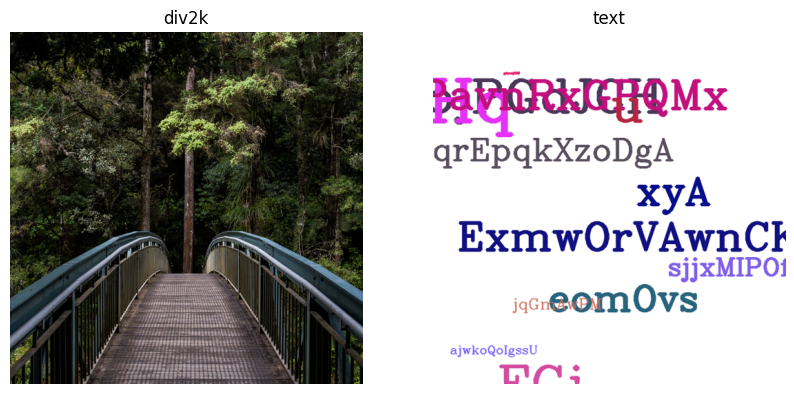

In [65]:
from function_regression.datasets.ffn_image_dataset import FFNImageDataset
from math import sqrt
import numpy as np
import exputils as eu
import matplotlib.pyplot as plt

def_config = eu.AttrDict()
def_config.name = 'div2k'

image_dataset_1 = FFNImageDataset(def_config)
x1,y1 = image_dataset_1.generate_samples()

res = int(sqrt(y1.shape[0]))
y1 = np.reshape(y1,(res,res,3))
x1 = np.reshape(x1,(res,res,2))


def_config.name = 'text'

image_dataset_2 = FFNImageDataset(def_config)
x2,y2 = image_dataset_2.generate_samples()


res = int(sqrt(y2.shape[0]))
y2= np.reshape(y2,(res,res,3))
x2 = np.reshape(x2,(res,res,2))


print(x1.shape)
print(y1.shape)

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns

# Display image1 in the first subplot
ax1.imshow(y1)
ax1.set_title('div2k')
ax1.axis('off')  # Turn off axis

# Display image2 in the second subplot
ax2.imshow(y2)
ax2.set_title('text')
ax2.axis('off')  # Turn off axis

# Show the plot
plt.show()

In [66]:
import numpy as np
import matplotlib.pyplot as plt
import traceback 

dataset_names = ['natural','text']

method_grouping = {'svr': ['svr'],
 'pls': ['pls'],
 'gradboost': ['gradboost'],
 'mlp': ['mlp 0.01', 'mlp 0.001', 'mlp 0.0001'],
 'mrbf': ['mrbf 0.01',
  'mrbf 0.001',
  'mrbf 0.0001'],
 'mrbf_fixed': ['mrbf 0.01 fixed',
  'mrbf 0.001 fixed',
  'mrbf 0.0001 fixed'],
 'urbf': ['urbf 0.01',
  'urbf 0.001',
  'urbf 0.0001'],
 'urbf_fixed':[
  'urbf 0.01 fixed',
  'urbf 0.001 fixed',
  'urbf 0.0001 fixed'],
 'ffn': ['ffn_0.01_0.1',
  'ffn_0.001_0.1',
  'ffn_0.0001_0.1',
  'ffn_0.01_1',
  'ffn_0.001_1',
  'ffn_0.0001_1',
  'ffn_0.01_10',
  'ffn_0.001_10',
  'ffn_0.0001_10'],
  'uffn': ['uffn_0.01_0.1',
  'uffn_0.001_0.1',
  'uffn_0.0001_0.1',
  'uffn_0.01_1',
  'uffn_0.001_1',
  'uffn_0.0001_1',
  'uffn_0.01_10',
  'uffn_0.001_10',
  'uffn_0.0001_10'],}

method_names = [x
    for xs in list(method_grouping.values())
    for x in xs
]

data = experiment_data_loader.experiment_data

_train_loss = {}
_test_loss = {}
_val_loss = {}

for method_id in list(data.keys()):
    method_data = data[method_id]['repetition_data']
    
    method_id = int(method_id)
    
    if method_id not in _train_loss:
        _train_loss[method_id] = []
        _test_loss[method_id] = []
        _val_loss[method_id] = []
    
    for rep_id in list(method_data.keys()):        
        _train_loss[method_id].append(method_data[rep_id]['train_loss'])
        _test_loss[method_id].append(method_data[rep_id]['test_loss'])
        _val_loss[method_id].append(method_data[rep_id]['val_loss'])
        
for key,val in _train_loss.items():
    try:
        _train_loss[key] = np.stack(val).transpose((1,0))
    except:
        pass

for key,val in _test_loss.items():
    try:
        _test_loss[key] = np.stack(val).transpose((1,0))
    except:
        pass
    
for key,val in _val_loss.items():
    try:
        _val_loss[key] = np.stack(val).transpose((1,0))
    except:
        pass

train_loss = {
    dataset_names[0]:{},
    dataset_names[1]:{}
}  

test_loss = {
    dataset_names[0]:{},
    dataset_names[1]:{}
}  

val_loss = {
    dataset_names[0]:{},
    dataset_names[1]:{}
}  

for key,val in _train_loss.items():
    dataset_key = dataset_names[0]
    
    if key > len(method_names):
        dataset_key = dataset_names[1]
        method_key = method_names[key - len(method_names) - 1]
    else:
        method_key = method_names[key - 1]

    train_loss[dataset_key][method_key] = val

for key,val in _test_loss.items():
    dataset_key = dataset_names[0]
    
    if key > len(method_names):
        dataset_key = dataset_names[1]
        method_key = method_names[key - len(method_names) - 1]
    else:
        method_key = method_names[key - 1]

    test_loss[dataset_key][method_key] = val
    
for key,val in _val_loss.items():
    dataset_key = dataset_names[0]
    
    if key > len(method_names):
        dataset_key = dataset_names[1]
        method_key = method_names[key - len(method_names) - 1]
    else:
        method_key = method_names[key - 1]

    val_loss[dataset_key][method_key] = val
    

max_method_num = len(method_names)

min_test_loss = {}
min_val_test_loss = {}


for method in method_names:
    for dataset in dataset_names:
        print(f"Analyzing: {dataset} {method}")
        
        if method not in train_loss[dataset]:
            continue
        
        try:
            rep_min_test_loss = np.min(test_loss[dataset][method],axis=0)
            idx_min_val_loss = np.argmin(val_loss[dataset][method],axis=0)

            if dataset not in min_test_loss:
                min_test_loss[dataset] = {}
                
            if dataset not in min_val_test_loss:
                min_val_test_loss[dataset] = {}

            min_test_loss[dataset][method] = np.mean(rep_min_test_loss,axis=0)
            min_val_test_loss[dataset][method] = np.mean(test_loss[dataset][method][idx_min_val_loss,:])
        except: 
            traceback.print_exc() 


### Calculate with reference to specific method
reference_method = method_names[4]

# Calculate relative min test loss
relative_min_test_loss = {}
relative_min_val_test_loss = {}

for dataset_name, dataset_vals in min_test_loss.items():
    relative_min_test_loss[dataset_name] = {method: val / dataset_vals[reference_method] for method, val in dataset_vals.items()}

for dataset_name, dataset_vals in min_val_test_loss.items():    
    relative_min_val_test_loss[dataset_name] = {method: val / dataset_vals[reference_method] for method, val in dataset_vals.items()}    


Analyzing: natural svr
Analyzing: text svr
Analyzing: natural pls
Analyzing: text pls
Analyzing: natural gradboost
Analyzing: text gradboost
Analyzing: natural mlp 0.01
Analyzing: text mlp 0.01
Analyzing: natural mlp 0.001
Analyzing: text mlp 0.001
Analyzing: natural mlp 0.0001
Analyzing: text mlp 0.0001
Analyzing: natural mrbf 0.01
Analyzing: text mrbf 0.01
Analyzing: natural mrbf 0.001
Analyzing: text mrbf 0.001
Analyzing: natural mrbf 0.0001
Analyzing: text mrbf 0.0001
Analyzing: natural mrbf 0.01 fixed
Analyzing: text mrbf 0.01 fixed
Analyzing: natural mrbf 0.001 fixed
Analyzing: text mrbf 0.001 fixed
Analyzing: natural mrbf 0.0001 fixed
Analyzing: text mrbf 0.0001 fixed
Analyzing: natural urbf 0.01
Analyzing: text urbf 0.01
Analyzing: natural urbf 0.001
Analyzing: text urbf 0.001
Analyzing: natural urbf 0.0001
Analyzing: text urbf 0.0001
Analyzing: natural urbf 0.01 fixed
Analyzing: text urbf 0.01 fixed
Analyzing: natural urbf 0.001 fixed
Analyzing: text urbf 0.001 fixed
Analyzing

In [67]:
import plotly.graph_objects as go
import plotly.express as px

colors = px.colors.qualitative.Plotly

colors = [*colors,*colors,*colors,*colors]

dataset_names = list(min_test_loss.keys())

for dataset_name in dataset_names:
    # Extract methods and corresponding test losses for the current dataset
    methods = list(relative_min_test_loss[dataset_name].keys())
    test_losses = [relative_min_test_loss[dataset_name][method] for method in methods]

    # Create a bar chart for the current dataset
    fig = go.Figure(data=[
        go.Bar(
            x=methods,
            y=test_losses,
            name=dataset_name,
            marker_color=colors[:len(methods)]  # Assign different colors to each bar
        )
    ])

    print(methods)
    
    # Customize the layout
    fig.update_layout(
        title=f'Relative Min Test Loss by Method for {dataset_name}',
        xaxis=dict(
            title='Method',
            #tickmode='array',
            #tickvals=list(range(len(methods))),
            #ticktext=methods
        ),
        yaxis=dict(
            title='Relative Min Test Loss'
        ),
        legend_title=dataset_name
        # Additional customizations can be added here
    )

    # Show the plot
    fig.show()

['mlp 0.01', 'mlp 0.001', 'mlp 0.0001', 'mrbf 0.01', 'mrbf 0.001', 'mrbf 0.0001', 'mrbf 0.01 fixed', 'mrbf 0.001 fixed', 'mrbf 0.0001 fixed', 'urbf 0.01', 'urbf 0.001', 'urbf 0.0001', 'urbf 0.01 fixed', 'urbf 0.001 fixed', 'urbf 0.0001 fixed', 'ffn_0.01_0.1', 'ffn_0.001_0.1', 'ffn_0.0001_0.1', 'ffn_0.01_1', 'ffn_0.001_1', 'ffn_0.0001_1', 'ffn_0.01_10', 'ffn_0.001_10', 'ffn_0.0001_10', 'uffn_0.01_0.1', 'uffn_0.001_0.1', 'uffn_0.0001_0.1', 'uffn_0.01_1', 'uffn_0.001_1', 'uffn_0.0001_1', 'uffn_0.01_10', 'uffn_0.001_10', 'uffn_0.0001_10']


['mlp 0.01', 'mlp 0.001', 'mlp 0.0001', 'mrbf 0.01', 'mrbf 0.001', 'mrbf 0.0001', 'mrbf 0.01 fixed', 'mrbf 0.001 fixed', 'mrbf 0.0001 fixed', 'urbf 0.01', 'urbf 0.001', 'urbf 0.0001', 'urbf 0.01 fixed', 'urbf 0.001 fixed', 'urbf 0.0001 fixed', 'ffn_0.01_0.1', 'ffn_0.001_0.1', 'ffn_0.0001_0.1', 'ffn_0.01_1', 'ffn_0.001_1', 'ffn_0.0001_1', 'ffn_0.01_10', 'ffn_0.001_10', 'ffn_0.0001_10', 'uffn_0.01_0.1', 'uffn_0.001_0.1', 'uffn_0.0001_0.1', 'uffn_0.01_1', 'uffn_0.001_1', 'uffn_0.0001_1', 'uffn_0.01_10', 'uffn_0.001_10', 'uffn_0.0001_10']


In [68]:
import pandas as pd

# Prepare the data for DataFrame
data_for_df = {}

for index, method in enumerate(method_names):
    data_for_df[method_names[index]] = []
    for dataset in dataset_names:
        loss = relative_min_val_test_loss[dataset].get(method, None)
        if loss is not None:
            loss = min(20, loss)  # Apply the same limit as used in the heatmap
        data_for_df[method_names[index]].append(loss)

# Create the DataFrame
df = pd.DataFrame(data_for_df, index=dataset_names)

df

,svr,pls,gradboost,mlp 0.01,mlp 0.001,mlp 0.0001,mrbf 0.01,mrbf 0.001,mrbf 0.0001,mrbf 0.01 fixed,...,ffn_0.0001_10,uffn_0.01_0.1,uffn_0.001_0.1,uffn_0.0001_0.1,uffn_0.01_1,uffn_0.001_1,uffn_0.0001_1,uffn_0.01_10,uffn_0.001_10,uffn_0.0001_10
natural,None,None,None,1.120605,1.0,1.154218,1.406466,1.028142,1.136671,2.025086,...,0.838717,1.487212,1.221130,1.307783,1.034072,0.885839,0.958713,0.948461,0.766624,0.793471
text,None,None,None,1.049370,1.0,1.146558,1.249366,0.775481,0.921072,1.404832,...,1.565677,0.972826,0.809468,0.962769,0.686179,0.434732,0.504298,1.461420,1.485345,1.479808


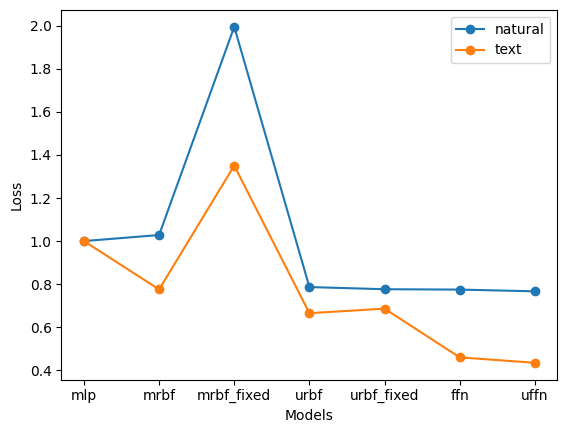

,svr,gradboost,mlp,mrbf,mrbf_fixed,urbf,urbf_fixed,ffn,uffn
natural,None,None,1.0,1.028142,1.995307,0.786427,0.776370,0.774671,0.766624
text,None,None,1.0,0.775481,1.350548,0.665157,0.686128,0.459882,0.434732


In [72]:
import pandas as pd


#df = df.drop(['svr','pls','gradboost'], axis=1)


method_dict = method_grouping


# Prepare the data for the new DataFrame
data_for_reduced_df = {group: [] for group in method_dict}

# Iterating over each row in the DataFrame
for index, row in df.iterrows():
    for group, methods in method_dict.items():
        group_values = [row[method] for method in methods if method in row]
        # Find the minimum value for this group, if there are any values
        min_value = min(group_values) if group_values else None
        data_for_reduced_df[group].append(min_value)

# Create the new reduced DataFrame
reduced_df = pd.DataFrame(data_for_reduced_df, index=df.index)


reduced_df = reduced_df.drop('pls', axis=1)


# This 'reduced_df' will now have columns named after each method group, 
# with the lowest value from that group in each row.

#print(reduced_df.to_latex())

# Plotting
for index, row in reduced_df.iterrows():
    plt.plot(row.index, row.values, '-o', label=f'{index}')

plt.ylabel('Loss')
plt.xlabel('Models')
plt.legend()

plt.savefig("../../../assets/image_regression.pdf", format="pdf", bbox_inches='tight')


plt.show()

reduced_df